# Visitas Semi-Automated EDA in Python

#### By Carlos Santillán

## Libraries

In [1]:
import pandas as pd                      ### manejo de dataframes
import numpy as np                       ### manejo de vectores
import io                                ### operador local de máquina
from sqlalchemy import create_engine     ### conexión a sql
import pyodbc                            ### conexión a sql
import time                              ### manejo de tiempo
import datetime                          ### manejo de tiempo
from datetime import date                ### fecha de hoy
import seaborn as sns                    ### Visualización
import matplotlib.pyplot as plt          ### Gráficos
import pandas.api.types as ptypes        ### valida entre numericas y categoricas
#import is_string_dtype, is_numeric_dtype

## Import data

In [2]:
hoy = date.today()    ### date of today

In this case, we will connect to SQL Server via *sqlalchemy*:

In [3]:
engine = create_engine(,
                       fast_executemany=True)

Then we can create queries for our data:

In [4]:
sql_query_CRM_VISITAS = "SELECT * FROM [DATA_REPOSITORY].[DATAM].[CRM_VISITAS]"
sql_query_AUDITH_NATURAL = "SELECT * FROM [DATA_REPOSITORY].[DATAM].[AUDITH_NATURAL]"
sql_query_AUDITH_TERRITORIO = "SELECT * FROM [DATA_REPOSITORY].[DATAM].[AUDITH_TERRITORIO]"

Transform queries into Pandas dataframe:

In [5]:
dfVisitas = pd.read_sql(sql_query_CRM_VISITAS, engine)

In [ ]:
#dfAudithNatural = pd.read_sql(sql_query_AUDITH_NATURAL, engine)
#dfAudithTerritorio = pd.read_sql(sql_query_AUDITH_TERRITORIO, engine)

We can also just import data locally:

In [4]:
#dfAudithCustomerFuerza = pd.read_csv("C:/Users/I0473941/OneDrive - Sanofi/archivos_compartidos/AUDITH/Audith_Customer_Fuerza_2021-03-23.csv")

In [9]:
dfVisitas2 = pd.read_csv("C:/Users/I0473941/OneDrive - Sanofi/Primary Care/1. Visitas/HISTORICAL_CSV/Template_Dashboard_Visitas_PC_2021-03-24.csv")

C:\Users\I0473941\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3146: DtypeWarning: Columns (6) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


Visualize first 5 rows of data:

In [10]:
dfVisitas2.head()

,V_BU,V_FUERZA,V_DTO,V_RUTA,PERIODO,ESPECIALIDAD,BRICK,V_EDONAME,V_CIUDAD,V_DELEGACION,V_EFFECTED,DATE_EFFECTED,FRECUENCIA,CUSTOMER_ID,INTERACTION_CHANNEL,MONTH,YEAR,WEEK,CHANNEL_H2,X_AVENTIS_MARK_03
0,PRIMARY CARE,HOSP GOBIERNO,PHG002,PHG00201,202101,INTERNISTA,1.0001e+07,DURANGO,DURANGO [DGO.],DURANGO,1.0,2021-01-29 00:00:00,1.0,1007124224,PHON,1,2021,4,Phone,NONE
1,PRIMARY CARE,HOSP GOBIERNO,PHG002,PHG00201,202101,ORTOPEDISTA TRAUMATOLOGO,6.00105e+06,COAHUILA,TORREON [COAH.],TORREON,1.0,2021-01-22 00:00:00,2.0,721234000010658,PHON,1,2021,3,Phone,NONE
2,PRIMARY CARE,HOSP GOBIERNO,PHG002,PHG00201,202101,URGENCIOLOGO,1.0001e+07,DURANGO,DURANGO [DGO.],DURANGO,1.0,2021-01-18 00:00:00,1.0,1007138374,EDE,1,2021,3,Remote Detailing,NONE
3,PRIMARY CARE,HOSP GOBIERNO,PHG002,PHG00201,202101,INTERNISTA,1.0001e+07,DURANGO,DURANGO [DGO.],DURANGO,1.0,2021-01-18 00:00:00,1.0,1007144512,PHON,1,2021,3,Phone,NONE
4,PRIMARY CARE,HOSP GOBIERNO,PHG002,PHG00201,202101,REUMATOLOGO,6.001e+06,COAHUILA,TORREON [COAH.],TORREON,1.0,2021-01-13 00:00:00,1.0,5018161569,PHON,1,2021,2,Phone,NONE


In [6]:
dfVisitas.head()
#dfAudithCustomerFuerza.head()

,BU,FUERZA,ESTATUS_RUTA,DTO,RUTA,REPRESENTANTE,ID_VISITA,DATE_PLANNED,EVT_STAT_CD,PERIODO,...,CIUDAD,DELEGACION,VISITA_EFECTUADA,ACOMPAÑADO_POR,DATE_EFFECTED,FRECUENCIA,CUSTOMER_ID,CUSTOMER_TYPE,HOST_PROCESS_DATE,INTERACTION_CHANNEL
0,CHC,REPRESENTANTES CHC,ACTV,CFC002,CFR00230,"RICO VAZQUEZ, ERICK",1111538000001867,29-JAN-21,Terminada,202101,...,MATAMOROS [TAMPS.],MATAMOROS,1.0,GTE. DISTRITO,29-JAN-21,1,60000546238789,PHAR,30-JAN-21,PHON
1,CHC,REPRESENTANTES CHC,ACTV,CFC002,CFR00230,"RICO VAZQUEZ, ERICK",1111538000001585,27-JAN-21,Terminada,202101,...,SINGUILUCAN [HGO.],SINGUILUCAN [HGO.],1.0,GTE. DISTRITO,27-JAN-21,0,60000540305315,PHAR,28-JAN-21,PHON
2,CHC,REPRESENTANTES CHC,ACTV,CFC002,CFR00230,"RICO VAZQUEZ, ERICK",1111538000001605,27-JAN-21,Terminada,202101,...,ATIZAPAN DE ZARAGOZA [MEX.],ATIZAPAN DE ZARAGOZA [MEX.],1.0,GTE. DISTRITO,27-JAN-21,0,60000540299394,PHAR,28-JAN-21,PHON
3,CHC,REPRESENTANTES CHC,ACTV,CFC002,CFR00230,"RICO VAZQUEZ, ERICK",1111538000001735,28-JAN-21,Terminada,202101,...,QUERETARO [QRO.],QUERETARO [QRO.],1.0,GTE. DISTRITO,28-JAN-21,0,60000540301624,PHAR,29-JAN-21,PHON
4,CHC,REPRESENTANTES CHC,ACTV,CFC002,CFR00230,"RICO VAZQUEZ, ERICK",1111538000001856,29-JAN-21,Terminada,202101,...,TEQUIXQUIAC [MEX.],TEQUIXQUIAC [MEX.],1.0,GTE. DISTRITO,29-JAN-21,0,60000540305326,PHAR,29-JAN-21,PHON


In [ ]:
#dfAudithNatural.head()

In [ ]:
#dfAudithTerritorio.head()

Visualiza last 5 rows of data:

In [7]:
dfVisitas.tail()
#dfAudithCustomerFuerza.tail()

,BU,FUERZA,ESTATUS_RUTA,DTO,RUTA,REPRESENTANTE,ID_VISITA,DATE_PLANNED,EVT_STAT_CD,PERIODO,...,CIUDAD,DELEGACION,VISITA_EFECTUADA,ACOMPAÑADO_POR,DATE_EFFECTED,FRECUENCIA,CUSTOMER_ID,CUSTOMER_TYPE,HOST_PROCESS_DATE,INTERACTION_CHANNEL
1065652,GENZYME,MZCZ,ACTV,MZC001,MZC00101,"AGUILAR MADRIGAL, ADRIANA PAOLA",1109859000003579,26-FEB-21,Terminada,202102,...,PACHUCA DE SOTO [HGO.],PACHUCA DE SOTO,1.0,NO ACOMPA?ADO,26-FEB-21,1,854077000007185,PRES,01-MAR-21,PHON
1065653,GENZYME,MZCZ,ACTV,MZC001,MZC00101,"AGUILAR MADRIGAL, ADRIANA PAOLA",1109859000003592,26-FEB-21,Terminada,202102,...,TOLUCA [MEX.],TOLUCA,1.0,NO ACOMPA?ADO,26-FEB-21,1,594518000021314,PRES,01-MAR-21,INPR
1065654,GENZYME,MZCZ,ACTV,MZC001,MZC00101,"AGUILAR MADRIGAL, ADRIANA PAOLA",1109859000003605,26-FEB-21,Terminada,202102,...,CIUDAD DE MEXICO [D.F.],BENITO JUAREZ,1.0,NO ACOMPA?ADO,26-FEB-21,1,1007163441,PRES,01-MAR-21,PHON
1065655,GENZYME,MZCZ,ACTV,MZC001,MZC00101,"AGUILAR MADRIGAL, ADRIANA PAOLA",1109859000003618,26-FEB-21,Terminada,202102,...,AZCAPOTZALCO [D.F.],Azcapotzalco,1.0,NO ACOMPA?ADO,26-FEB-21,1,777096000000838,PRES,01-MAR-21,INPR
1065656,GENZYME,MZCZ,ACTV,MZC001,MZC00101,"AGUILAR MADRIGAL, ADRIANA PAOLA",1109859000003631,26-FEB-21,Terminada,202102,...,CUAUHTEMOC [D.F.],CUAUHTEMOC,1.0,NO ACOMPA?ADO,26-FEB-21,2,841481000013857,PRES,01-MAR-21,INPR


In [ ]:
#dfAudithNatural.tail()

In [ ]:
#dfAudithTerritorio.tail()

Print name of columns:

In [11]:
dfVisitas2.columns
#dfAudithCustomerFuerza.columns

Index(['V_BU', 'V_FUERZA', 'V_DTO', 'V_RUTA', 'PERIODO', 'ESPECIALIDAD',
       'BRICK', 'V_EDONAME', 'V_CIUDAD', 'V_DELEGACION', 'V_EFFECTED',
       'DATE_EFFECTED', 'FRECUENCIA', 'CUSTOMER_ID', 'INTERACTION_CHANNEL',
       'MONTH', 'YEAR', 'WEEK', 'CHANNEL_H2', 'X_AVENTIS_MARK_03'],
      dtype='object')

### info()

It gives the count of non-null values for each column and its data type.


In [12]:
dfVisitas2.info()
#dfAudithCustomerFuerza.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 693872 entries, 0 to 693871
Data columns (total 20 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   V_BU                 693872 non-null  object 
 1   V_FUERZA             693872 non-null  object 
 2   V_DTO                693872 non-null  object 
 3   V_RUTA               693872 non-null  object 
 4   PERIODO              693872 non-null  int64  
 5   ESPECIALIDAD         693857 non-null  object 
 6   BRICK                693849 non-null  object 
 7   V_EDONAME            693872 non-null  object 
 8   V_CIUDAD             693872 non-null  object 
 9   V_DELEGACION         693811 non-null  object 
 10  V_EFFECTED           693872 non-null  float64
 11  DATE_EFFECTED        693872 non-null  object 
 12  FRECUENCIA           556798 non-null  float64
 13  CUSTOMER_ID          693872 non-null  int64  
 14  INTERACTION_CHANNEL  693872 non-null  object 
 15  MONTH            

In [ ]:
#dfAudithNatural.info()

In [ ]:
#dfAudithTerritorio.info()

### describe()

This function provides basic statistics of each column. By passing the parameter “include = ‘all’”, it outputs:

a) the value count,

b) unique count,

c) the top-frequency value of the categorical variables and

d) count,

e) mean,

f) standard deviation,

g) min,

h) max, and

i) percentile of numeric variables

If we leave the *include* parameter empty, it will only output the numerical variables 

In [14]:
dfVisitas2.describe()
#dfAudithCustomerFuerza.describe(include="all")

,PERIODO,V_EFFECTED,FRECUENCIA,CUSTOMER_ID,MONTH,YEAR,WEEK
count,693872.000000,693872.0,556798.000000,6.938720e+05,693872.000000,693872.000000,693872.000000
mean,202023.876923,1.0,1.106286,2.526905e+14,5.797019,2020.182328,23.963150
std,36.993092,0.0,0.686295,3.607165e+14,3.511887,0.386115,15.310646
min,202001.000000,1.0,0.000000,1.007098e+09,1.000000,2020.000000,1.000000
25%,202004.000000,1.0,1.000000,1.007160e+09,2.000000,2020.000000,9.000000
50%,202008.000000,1.0,1.000000,1.007194e+09,6.000000,2020.000000,24.000000
75%,202011.000000,1.0,2.000000,5.939430e+14,9.000000,2020.000000,37.000000
max,202103.000000,1.0,4.000000,1.122098e+15,12.000000,2021.000000,53.000000


In [ ]:
#dfAudithNatural.describe(include="all")

In [ ]:
#dfAudithTerritorio.describe(include="all")

### Missing Values 

Identifying the number of missing values. *isnull().sum()* returns the number of missing values for each column.

In [18]:
dfVisitas2.isnull().sum()
#dfAudithCustomerFuerza.isnull().sum()

V_BU                        0
V_FUERZA                    0
V_DTO                       0
V_RUTA                      0
PERIODO                     0
ESPECIALIDAD               15
BRICK                      23
V_EDONAME                   0
V_CIUDAD                    0
V_DELEGACION               61
V_EFFECTED                  0
DATE_EFFECTED               0
FRECUENCIA             137074
CUSTOMER_ID                 0
INTERACTION_CHANNEL         0
MONTH                       0
YEAR                        0
WEEK                        0
CHANNEL_H2                  0
X_AVENTIS_MARK_03           0
dtype: int64

In [ ]:
#dfAudithNatural.isnull().sum()

In [ ]:
#dfAudithTerritorio.isnull().sum()

We can also calculate the percentage of missing values:

In [12]:
missingCountAudithCustomerFuerza = dfAudithCustomerFuerza.isnull().sum()
valueCountAudithCustomerFuerza = dfAudithCustomerFuerza.isnull().count()
missingPercentageAudithCusotmerFuerza = round(missingCountAudithCustomerFuerza / valueCountAudithCustomerFuerza * 100, 2)    ### calculate percentage
missingDfAudithCustomerFuerza = pd.DataFrame({'count':missingCountAudithCustomerFuerza, 'percentage':missingPercentageAudithCusotmerFuerza})

In [ ]:
missingCountAudithNatural = dfAudithNatural.isnull().sum()
valueCountAudithNatural = dfAudithNatural.isnull().count()
missingPercentageAudithNatural = round(missingCountAudithNatural / valueCountAudithNatural * 100, 2)    ### calculate percentage
missingDfAudithNatural = pd.Dataframe({'count':missingCountAudithNatural, 'percentage':missingPercentageAudithNatural})

In [19]:
#missingDfAudithCustomerFuerza

In [26]:
len(dfVisitas)

1065657

In [25]:
len(dfVisitas2)

693872

In [22]:
missingCount = dfVisitas2.isnull().sum()
valueCount = dfVisitas2.isnull().count()
missingPercentage = round(missingCount / valueCount * 100, 2)    ### calculate percentage
dfMissing = pd.DataFrame({'count':missingCount, 'percentage':missingPercentage})

In [23]:
dfMissing

,count,percentage
V_BU,0,0.00
V_FUERZA,0,0.00
V_DTO,0,0.00
V_RUTA,0,0.00
PERIODO,0,0.00
ESPECIALIDAD,15,0.00
BRICK,23,0.00
V_EDONAME,0,0.00
V_CIUDAD,0,0.00
V_DELEGACION,61,0.01


We can then visualize the percentage of missing values. We can also add labels to the bars using a *for loop*

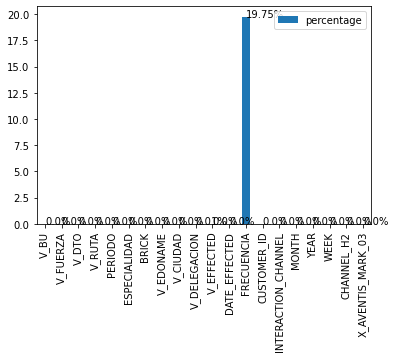

In [27]:
barchart = dfMissing.plot.bar(y='percentage')

for index, percentage in enumerate(missingPercentage):
    barchart.text(index, percentage, str(percentage) + '%')

## Feature Engineering:

This is the only part that requires some human judgment, thus cannot be easily automated. 

It can be seen that, for 'FRECUENCIA' in the dataframe of 'VISITAS' we have a lot of NaN and missing values (almost 20%), so we need to transform them.

We can generate some additional categorical variables since the percentages of missing values are really high:

In [29]:
dfVisitas2['WITH_FRECUENCIA'] = np.where(dfVisitas2['FRECUENCIA'].isnull(), 'Yes', 'No')
#dfAudithCustomerFuerza['WITH_CDG_MEDICO_SAN'] = np.where(dfAudithCustomerFuerza['cdg_medico_san'].isnull(), 'Yes', 'No')
#dfAudithCustomerFuerza['WITH_CODIGO_CRM'] = np.where(dfAudithCustomerFuerza['CODIGO_CRM'].isnull(), 'Yes', 'No')

We can also transform date columns into the appropiate datetime format:

We also can trim the dataframe column-wise in order to keep only the ones that are going to be analyzed:

In [30]:
#dfAudithCustomerFuerza = dfAudithCustomerFuerza.drop(['NOM_BRICK_REV', 'nombre'], axis=1)

Additional variables will need to be classified into numerical and categorical, *is_string_dtype* and *is_numeric_dtype* are handy functions to identify the data type of each field.

In [31]:
num_list = []     ### list for numeric variables
cat_list = []     ### list for categorical variables

for column in dfVisitas2:
    if ptypes.is_numeric_dtype(dfVisitas2[column]):
        num_list.append(column)
    if ptypes.is_string_dtype(dfVisitas2[column]):
        cat_list.append(column)

In [32]:
print("Numerical variables:")
print(num_list)
print("\n")
print("Categorical Variables:")
print(cat_list)


Numerical variables:
['PERIODO', 'V_EFFECTED', 'FRECUENCIA', 'CUSTOMER_ID', 'MONTH', 'YEAR', 'WEEK']


Categorical Variables:
['V_BU', 'V_FUERZA', 'V_DTO', 'V_RUTA', 'ESPECIALIDAD', 'BRICK', 'V_EDONAME', 'V_CIUDAD', 'V_DELEGACION', 'DATE_EFFECTED', 'INTERACTION_CHANNEL', 'CHANNEL_H2', 'X_AVENTIS_MARK_03', 'WITH_FRECUENCIA']


## Univariate Analysis

- **Categorical Variables** $\Rightarrow$ **Bar chart**
    - Plot the frequency of each categorical value


- **Numerical Variables** $\Rightarrow$ **Histogram**
    - To try and see the distribution

To graph out the numeric variable distribution, we can use histogram which is very similar to bar chart. It splits continuous numbers into equal size bins and plot the frequency of records falling between the interval.

<ipython-input-33-c4a992266411>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(column)


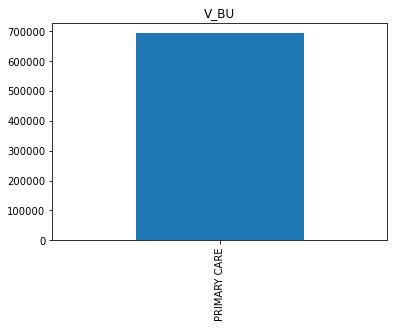

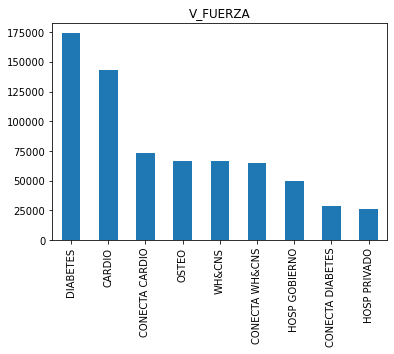

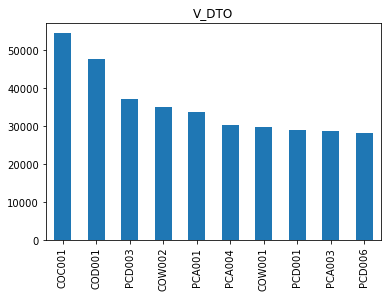

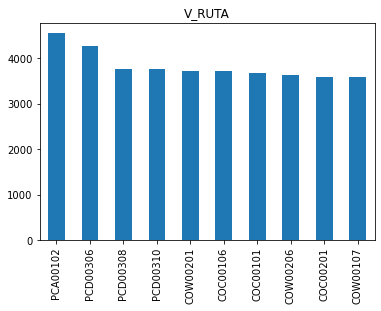

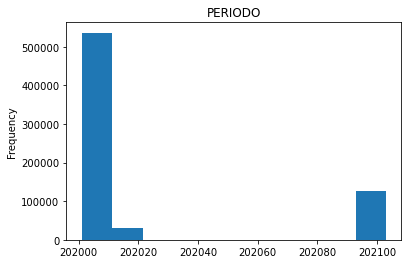

...

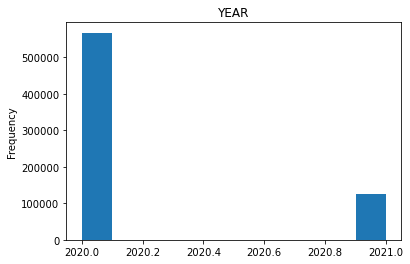

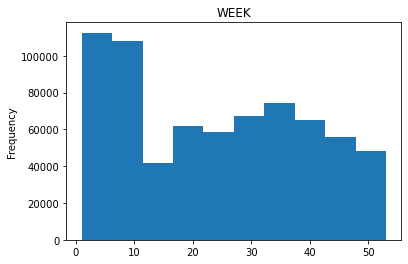

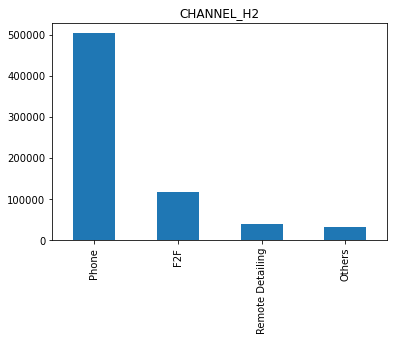

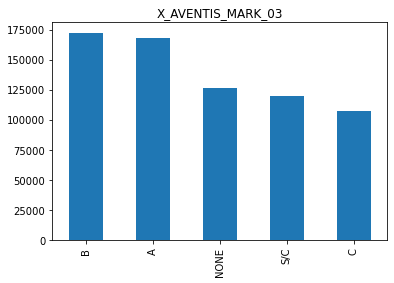

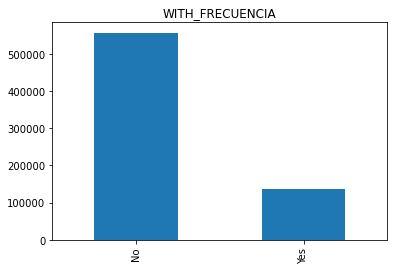

In [33]:
for column in dfVisitas2:
    plt.figure(column)
    plt.title(column)
    if ptypes.is_numeric_dtype(dfVisitas2[column]):
        dfVisitas2[column].plot(kind = 'hist')
    elif ptypes.is_string_dtype(dfVisitas2[column]):
        ### show only top 10 value count in each categorical data
        dfVisitas2[column].value_counts()[:10].plot(kind = 'bar')

### Univariate Insights for VISITAS (data from March 24, 2021)

1. Top 5 V_FUERZA: DIABETES, CARDIO, CONECTA CARDIO, OSTEO, WH&CNS


2. Top 5 V_DTO: COC001, COD001, PCD003, COW002, PCA001


3. Top 5 V_RUTA: PCA00102, PCD00306, PCD00308, PCD00310, COW00201


4. Top 5 ESPECIALIDAD: MEDICO GENERAL, INTERNISTA, TRAUMATOLOGO, CADENA, GINECOLOGO


5. Top 5 BRICK: 1007001, 028001001, 30005001, 14001001, 3005002


6. Top 5 V_EDONAME: DISTRITO FEDERAL, MEXICO, JALISCO, NUEVO LEON, BAJA CALIFORNIA


7. Top 5 V_CIUDAD: CUAHUTEMOC(DF), GUADALAJARA, MONTERREY, PUEBLA, TIJUANA


8. Top 5 V_DELEGACION: CUAHUTEMOC, GUADALAJARA, MONTERREY, PUEBLA, BENITO JUAREZ


9. Top 5 DATE_EFFECTED: 2021-02-03, 2020-09-03, 2020-08-26, 2020-09-02, 2020-08-25


10. FRECUENCIA: mostly 1 visit, with 3 and 4 being outliers


11. Top INTERACTION_CHANNEL: PHON, EC, INPR, WEB, EDE


12. MONTH with most frequency: 1 (January)


13. Most visited WEEK: from 1 to 10, and 30 to 40


14. Top CHANNEL_H2: Phone, F2F, Remote Detailing, Others

I use this for loop to iterate through the columns in the data frame and create a plot for each column. Then use a histogram if it is numerical variables and a bar chart if categorical.

## Multivariate Analysis

Combinations of numerical variables and categorical variables.

### 1. Numerical vs. Numerical $\Rightarrow$ heat map or pair plot

- We first need to compute the **correlation matrix**
- Then we visualize through a **heat map**

<AxesSubplot:>

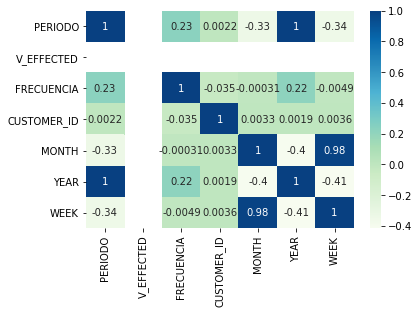

In [34]:
correlationMatrix = dfVisitas2.corr()
sns.heatmap(correlationMatrix, cmap = "GnBu", annot = True)

#### Numerical vs. Numerical Insights from VISITAS (24-Mar-2021)

- 'PERIODO' and 'YEAR' have a perfect correlation, which is obvious

- Not much can be inferred currently since most of the variables are descriptive or relevant only for the date

Note that the correlation matrix only indicates the strength of linear relationship, so we must also plot the numerical values:

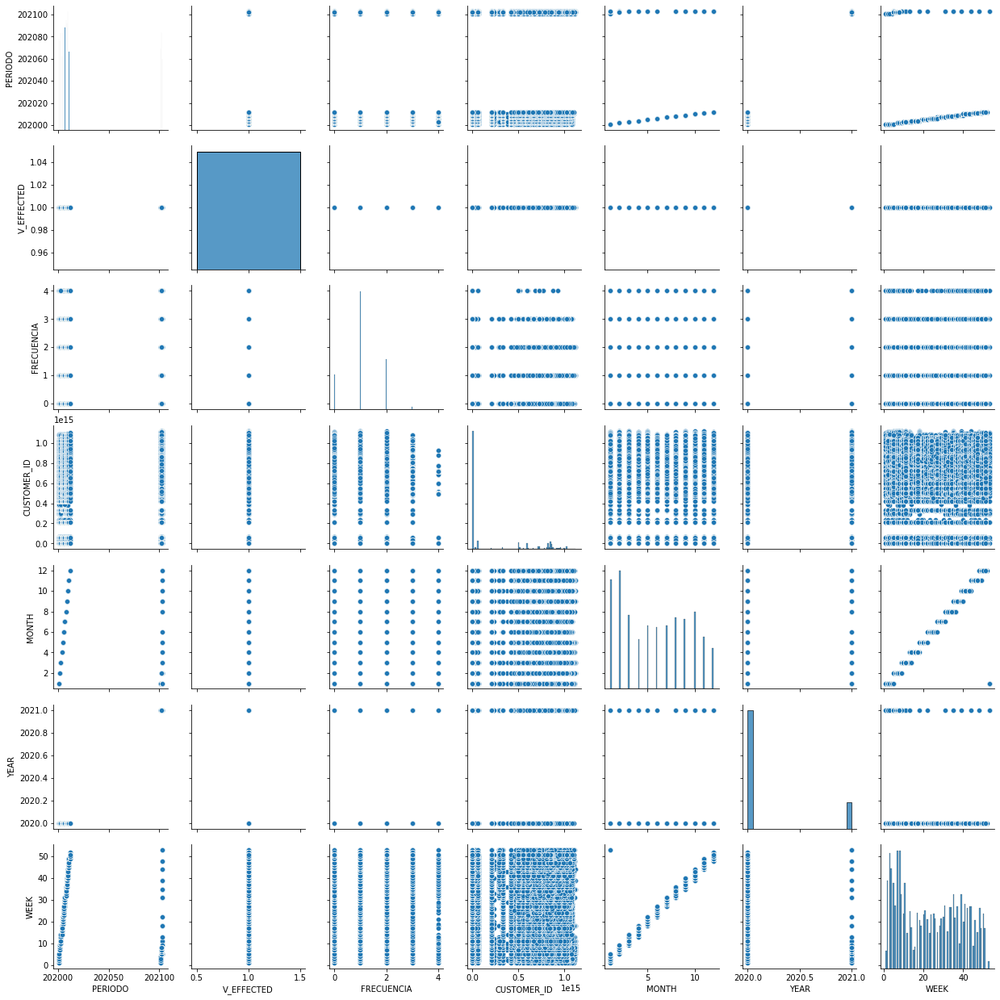

In [35]:
sns.pairplot(dfVisitas2, height = 2.5)

**Pair plot** or **scatterplot** is a good complementary to the correlation matrix, especially when **nonlinear relationships** (e.g. exponential, inverse relationship) might exist. 

We can assign numerical values to some of our categorical variables in order to see how they compare using correlation.

For this it is practical to create a dataframe that contains only the categorical variables:

In [44]:
dfVisitasCategorical = dfVisitas2[cat_list]

In [46]:
dfVisitasCategorical.head()

,V_BU,V_FUERZA,V_DTO,V_RUTA,ESPECIALIDAD,BRICK,V_EDONAME,V_CIUDAD,V_DELEGACION,DATE_EFFECTED,INTERACTION_CHANNEL,CHANNEL_H2,X_AVENTIS_MARK_03,WITH_FRECUENCIA
0,PRIMARY CARE,HOSP GOBIERNO,PHG002,PHG00201,INTERNISTA,1.0001e+07,DURANGO,DURANGO [DGO.],DURANGO,2021-01-29 00:00:00,PHON,Phone,NONE,No
1,PRIMARY CARE,HOSP GOBIERNO,PHG002,PHG00201,ORTOPEDISTA TRAUMATOLOGO,6.00105e+06,COAHUILA,TORREON [COAH.],TORREON,2021-01-22 00:00:00,PHON,Phone,NONE,No
2,PRIMARY CARE,HOSP GOBIERNO,PHG002,PHG00201,URGENCIOLOGO,1.0001e+07,DURANGO,DURANGO [DGO.],DURANGO,2021-01-18 00:00:00,EDE,Remote Detailing,NONE,No
3,PRIMARY CARE,HOSP GOBIERNO,PHG002,PHG00201,INTERNISTA,1.0001e+07,DURANGO,DURANGO [DGO.],DURANGO,2021-01-18 00:00:00,PHON,Phone,NONE,No
4,PRIMARY CARE,HOSP GOBIERNO,PHG002,PHG00201,REUMATOLOGO,6.001e+06,COAHUILA,TORREON [COAH.],TORREON,2021-01-13 00:00:00,PHON,Phone,NONE,No


Commonly, there are 2 types of Categorical variables:

a) Nominal: where the categories are only labeled without any order of precedence

b) Ordinal: features which have some order associated with them


One of the most common ways to analyze the relationship between a categorical feature and a continuous feature is to plot a boxplot. The boxplot is a simple way of representing statistical data on a plot in which a rectangle is drawn to represent the second and third quartiles, usually with a vertical line inside to indicate the median value. The lower and upper quartiles are shown as horizontal lines at either side of the rectangle.

We look at how many different unique values there are within my categorical variables:

In [51]:
for column in dfVisitasCategorical:
    print(str(column) + " :" + str(len(dfVisitasCategorical[column].unique())))

V_BU :1
V_FUERZA :9
V_DTO :27
V_RUTA :289
ESPECIALIDAD :72
BRICK :6497
V_EDONAME :32
V_CIUDAD :668
V_DELEGACION :1874
DATE_EFFECTED :354
INTERACTION_CHANNEL :6
CHANNEL_H2 :4
X_AVENTIS_MARK_03 :5
WITH_FRECUENCIA :2


It is common practice to transform "manually" variables that have 15 or less categories in them.

Also, we can notice that variables related to geography might be better as they are, since they will help us classify and are not necesarilly correlated to the numerical variables.

For replacing value we can use *dictionary comprehension* which are usually assigned in alphabetical order:

In [53]:
labelsFuerza = dfVisitasCategorical['V_FUERZA'].astype('category').cat.categories.tolist()
replaceMapFuerza = {'V_FUERZA' : {k: v for k,
                                  v in zip(labelsFuerza,
                                           list(range(1, len(labelsFuerza) + 1)))}}

labelsDTO = dfVisitasCategorical['V_DTO'].astype('category').cat.categories.tolist()
replaceMapDTO = {'V_DTO' : {k: v for k,
                                  v in zip(labelsDTO,
                                           list(range(1, len(labelsDTO) + 1)))}}

labelsEspecialidad = dfVisitasCategorical['ESPECIALIDAD'].astype('category').cat.categories.tolist()
replaceMapEspecialidad = {'ESPECIALIDAD' : {k: v for k,
                                  v in zip(labelsEspecialidad,
                                           list(range(1, len(labelsEspecialidad) + 1)))}}

labelsChannel = dfVisitasCategorical['CHANNEL_H2'].astype('category').cat.categories.tolist()
replaceMapChannel = {'CHANNEL_H2' : {k: v for k,
                                  v in zip(labelsChannel,
                                           list(range(1, len(labelsChannel) + 1)))}}

labelsFrecuencia = dfVisitasCategorical['WITH_FRECUENCIA'].astype('category').cat.categories.tolist()
replaceMapFrecuencia = {'WITH_FRECUENCIA' : {k: v for k,
                                  v in zip(labelsFrecuencia,
                                           list(range(1, len(labelsFrecuencia) + 1)))}}



We create a copy of the dataframe in order to preserve the original data:

In [55]:
dfVisitasCategoricalCopy = dfVisitasCategorical.copy()

Then we can pass our created mapping dictionary using it as an argument in the *replace()* function:

In [56]:
dfVisitasCategoricalCopy.replace(replaceMapFuerza, inplace = True)
dfVisitasCategoricalCopy.replace(replaceMapDTO, inplace = True)
dfVisitasCategoricalCopy.replace(replaceMapEspecialidad, inplace = True)
dfVisitasCategoricalCopy.replace(replaceMapChannel, inplace = True)
dfVisitasCategoricalCopy.replace(replaceMapFrecuencia, inplace = True)

In [57]:
dfVisitasCategoricalCopy.head()

,V_BU,V_FUERZA,V_DTO,V_RUTA,ESPECIALIDAD,BRICK,V_EDONAME,V_CIUDAD,V_DELEGACION,DATE_EFFECTED,INTERACTION_CHANNEL,CHANNEL_H2,X_AVENTIS_MARK_03,WITH_FRECUENCIA
0,PRIMARY CARE,6,23,PHG00201,39.0,1.0001e+07,DURANGO,DURANGO [DGO.],DURANGO,2021-01-29 00:00:00,PHON,3,NONE,1
1,PRIMARY CARE,6,23,PHG00201,56.0,6.00105e+06,COAHUILA,TORREON [COAH.],TORREON,2021-01-22 00:00:00,PHON,3,NONE,1
2,PRIMARY CARE,6,23,PHG00201,70.0,1.0001e+07,DURANGO,DURANGO [DGO.],DURANGO,2021-01-18 00:00:00,EDE,4,NONE,1
3,PRIMARY CARE,6,23,PHG00201,39.0,1.0001e+07,DURANGO,DURANGO [DGO.],DURANGO,2021-01-18 00:00:00,PHON,3,NONE,1
4,PRIMARY CARE,6,23,PHG00201,66.0,6.001e+06,COAHUILA,TORREON [COAH.],TORREON,2021-01-13 00:00:00,PHON,3,NONE,1


### 2. Categorical vs. Categorical $\Rightarrow$ Countplot with hue

The relationship between two categorical variables can be visualized using grouped bar charts. The frequency of the primary categorical variables is broken down by the secondary category. This can be achieved using *sns.countplot()*.

I use a nested for loop, where the outer loop iterates through all categorical variables and assigns them as the primary category, then the inner loop iterate through the list again to pair the primary category with a different secondary category.

<ipython-input-58-404c23335f6d>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15, 15))


KeyboardInterrupt: 

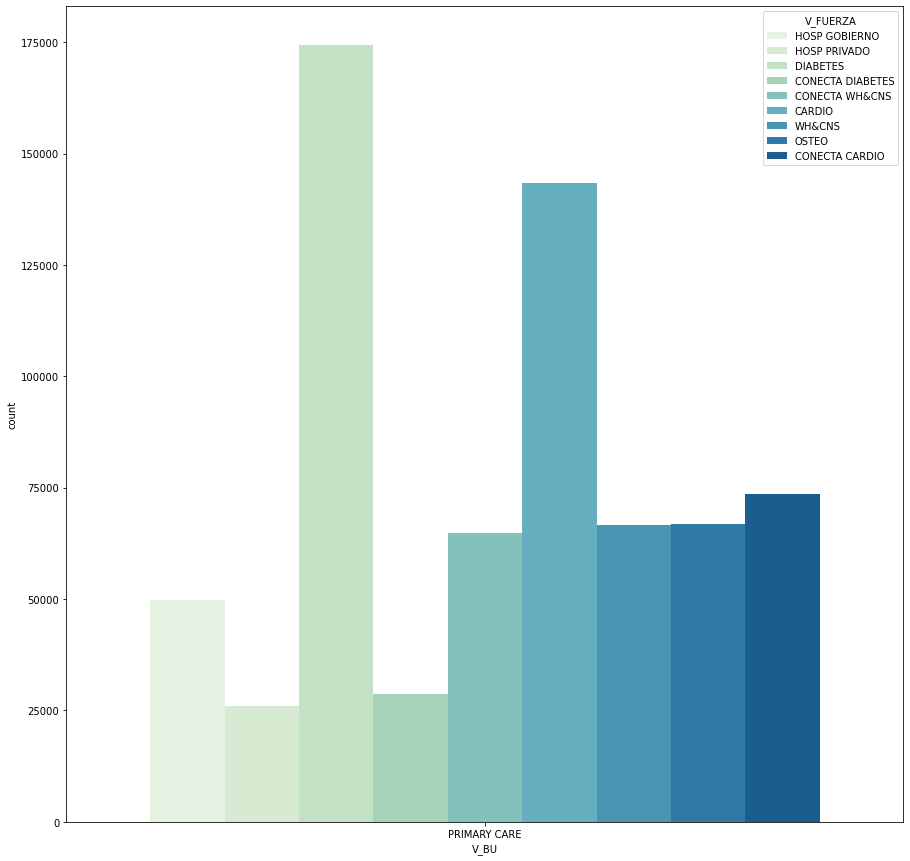

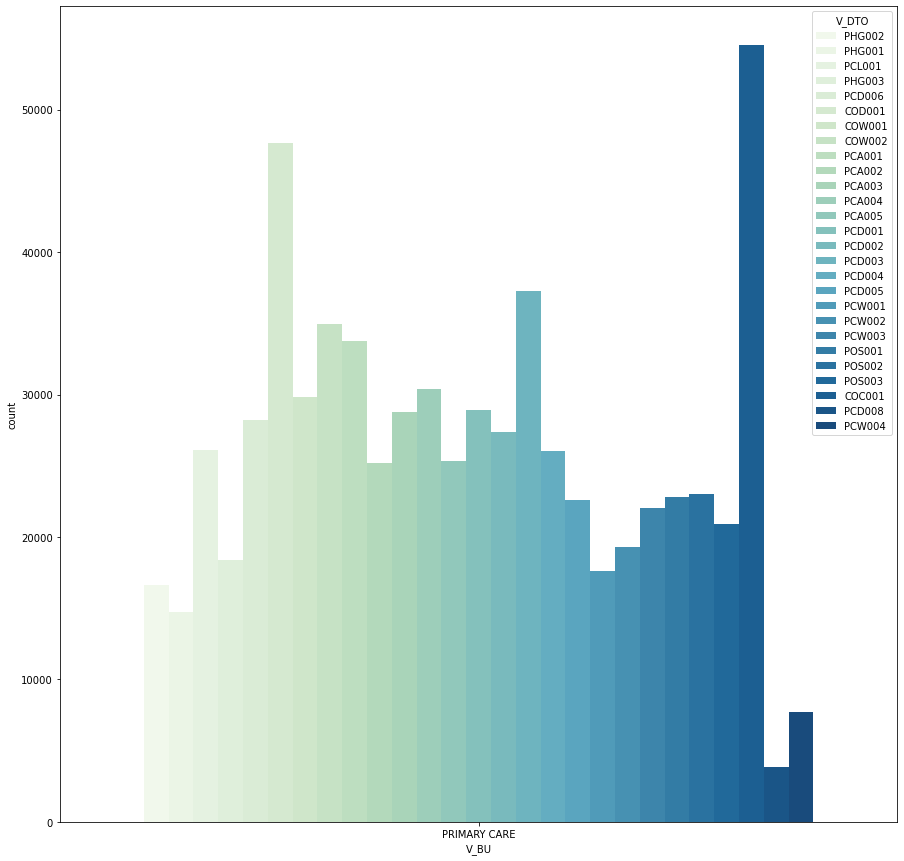

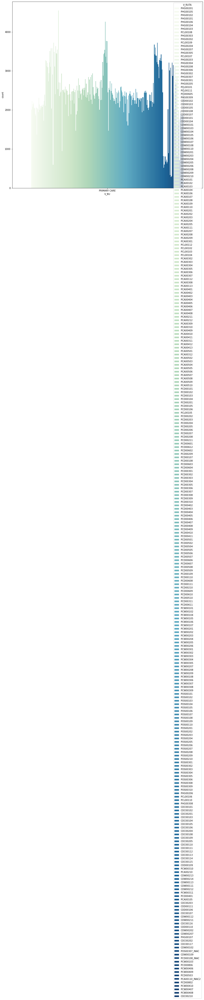

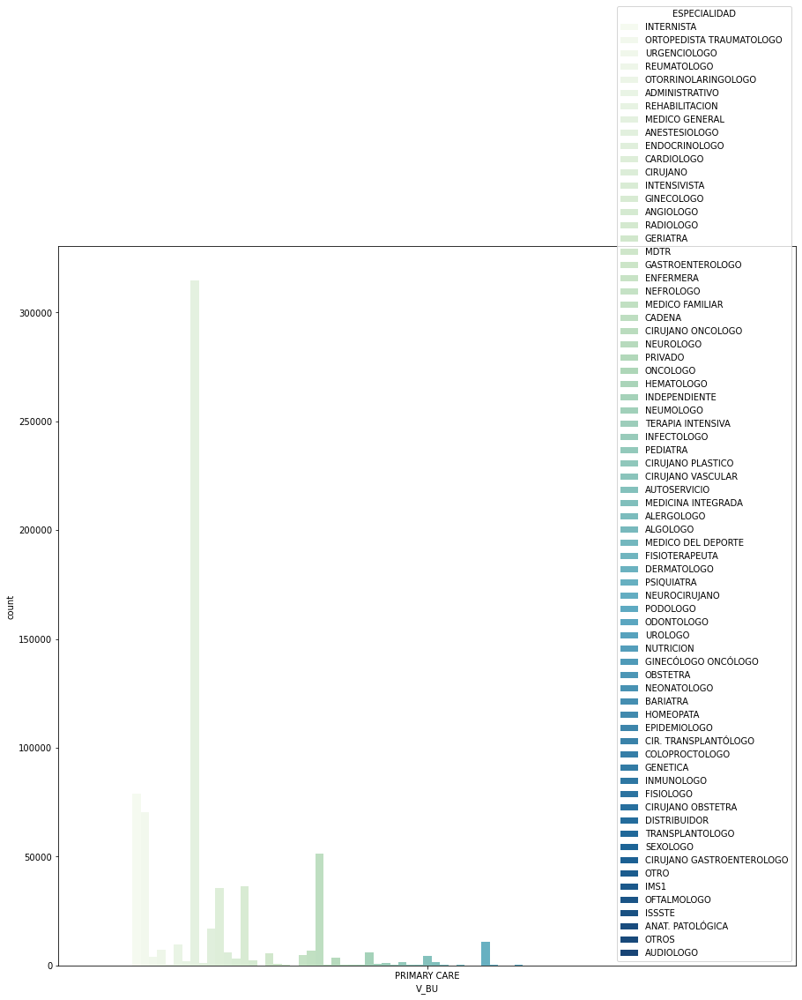

ValueError: Image size of 897x97509 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 1080x1080 with 1 Axes>

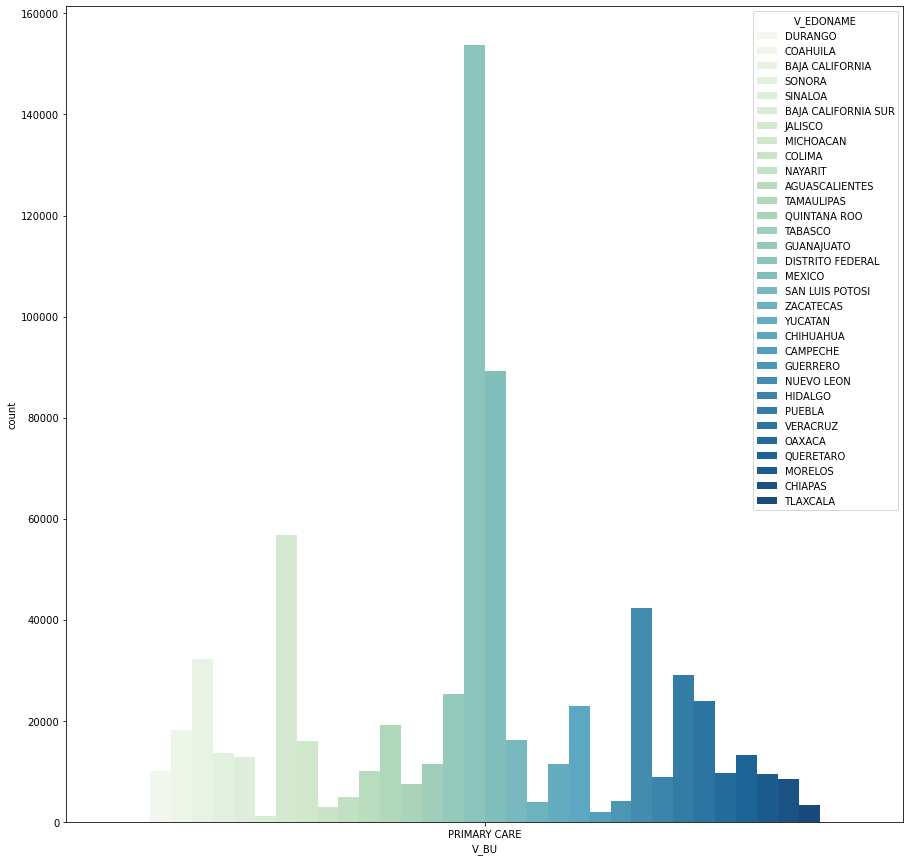

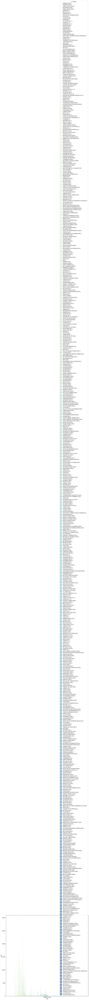

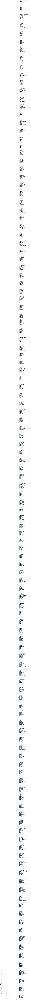

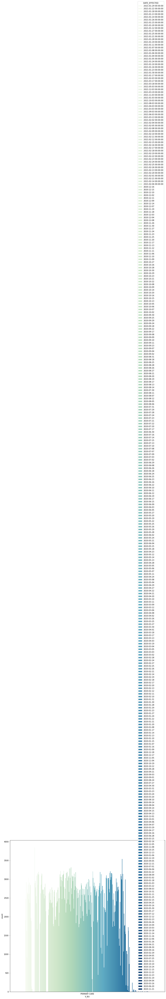

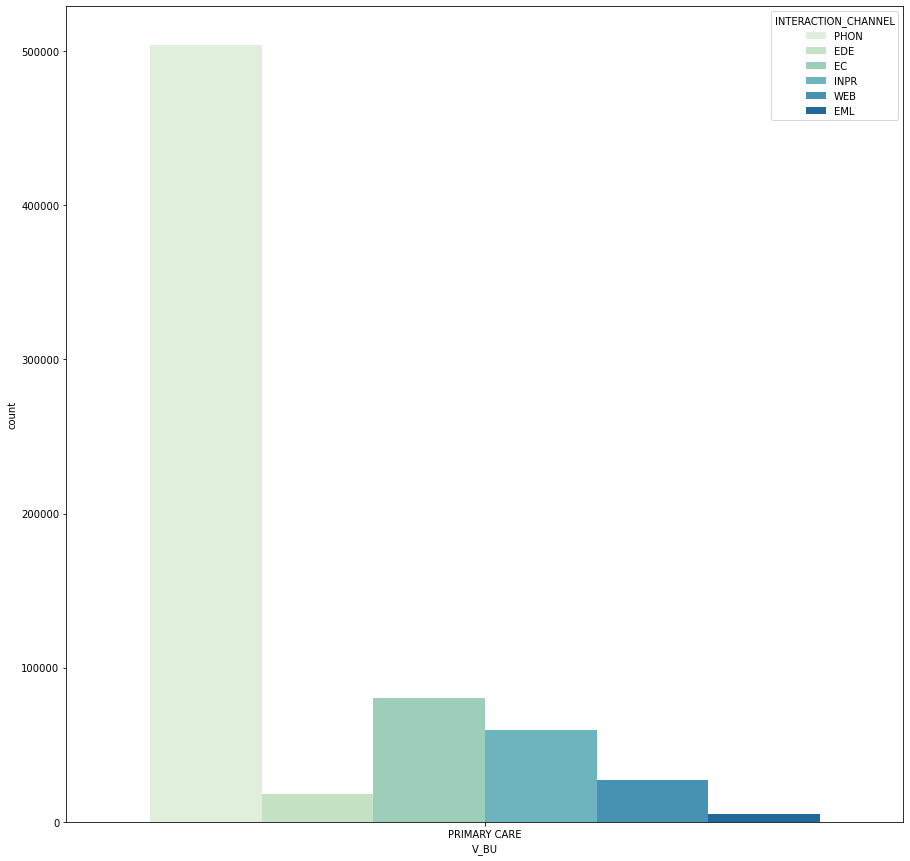

...

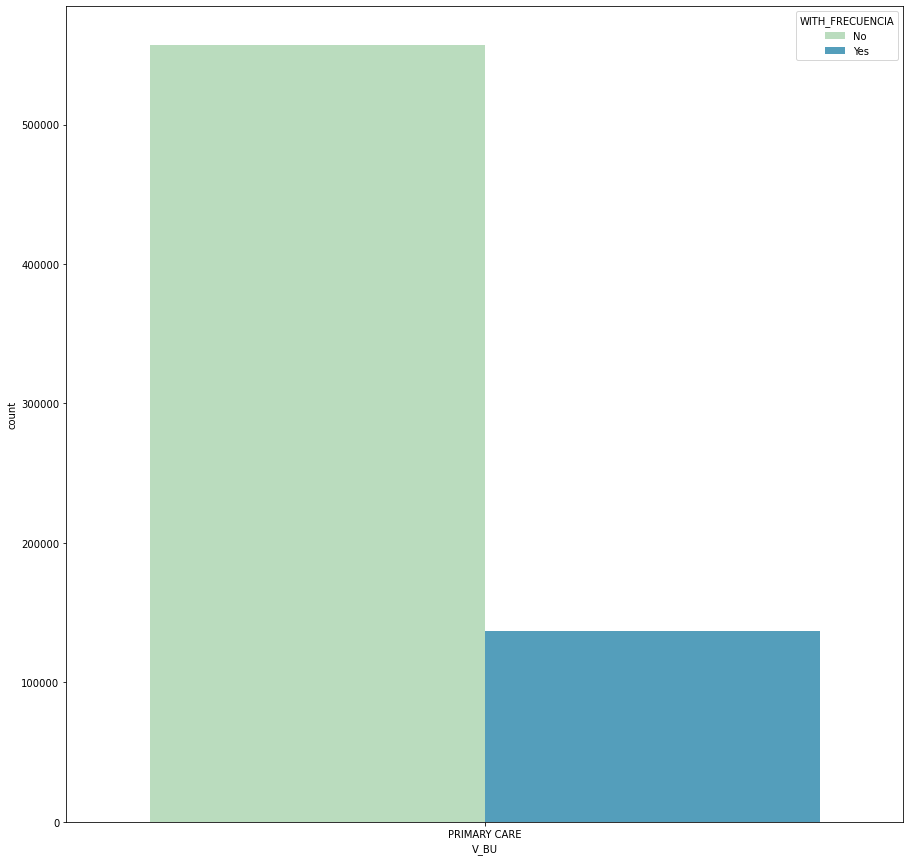

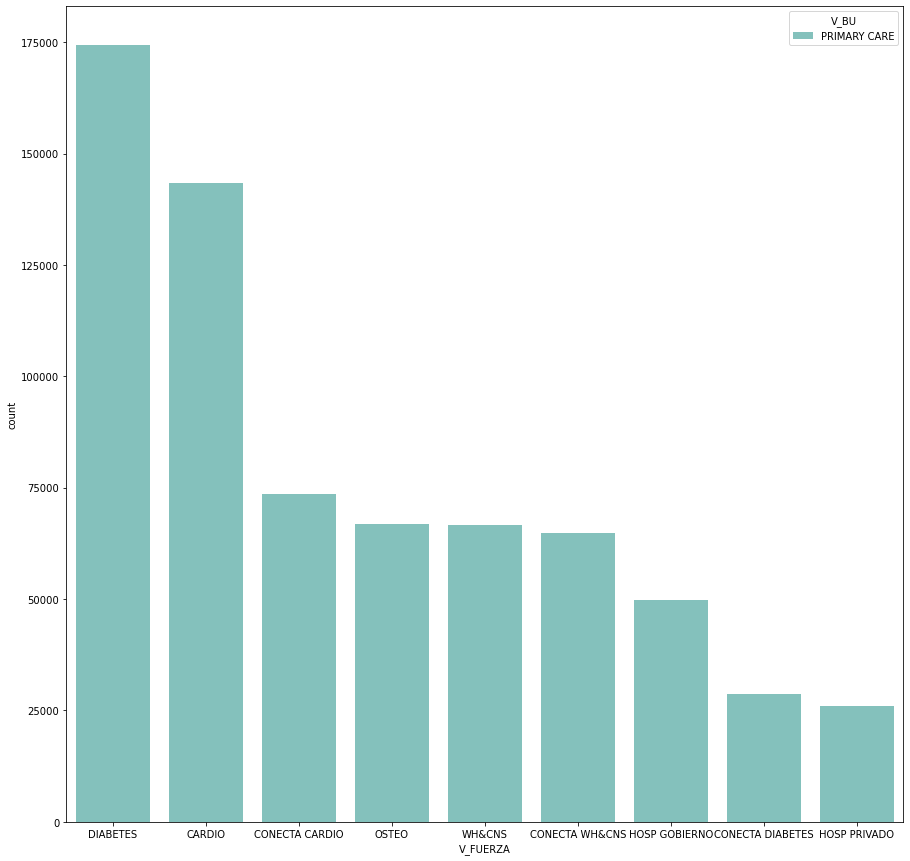

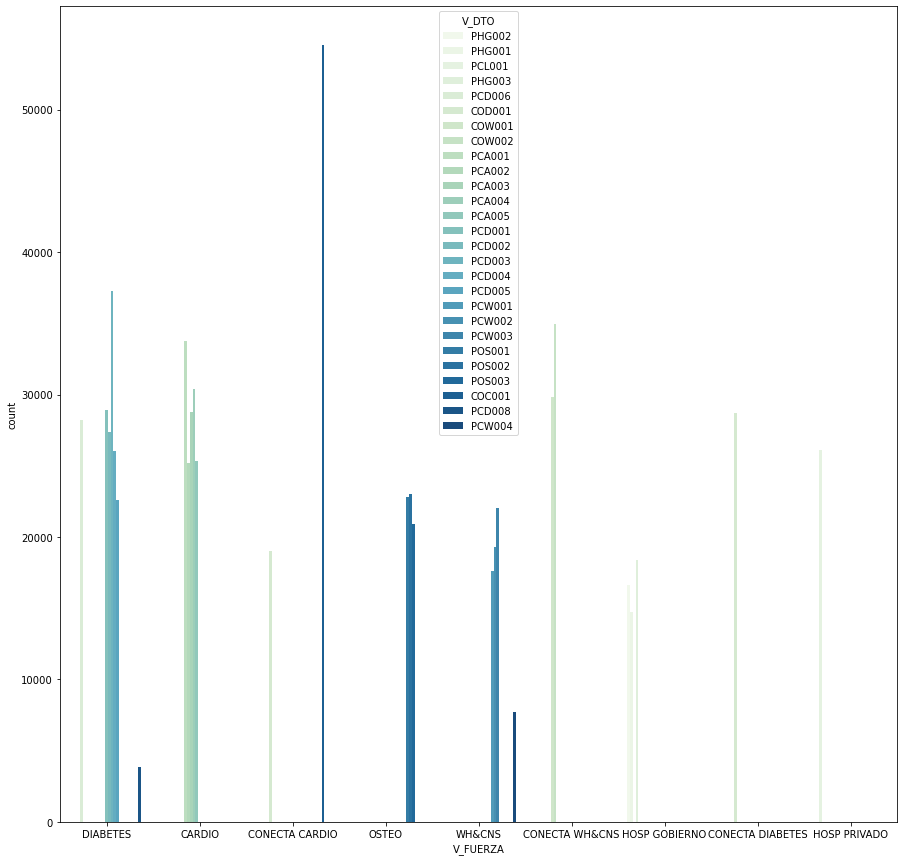

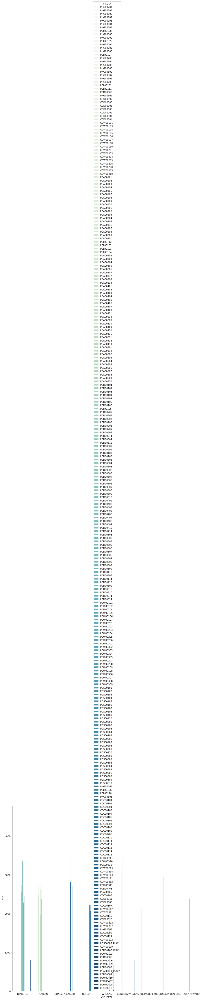

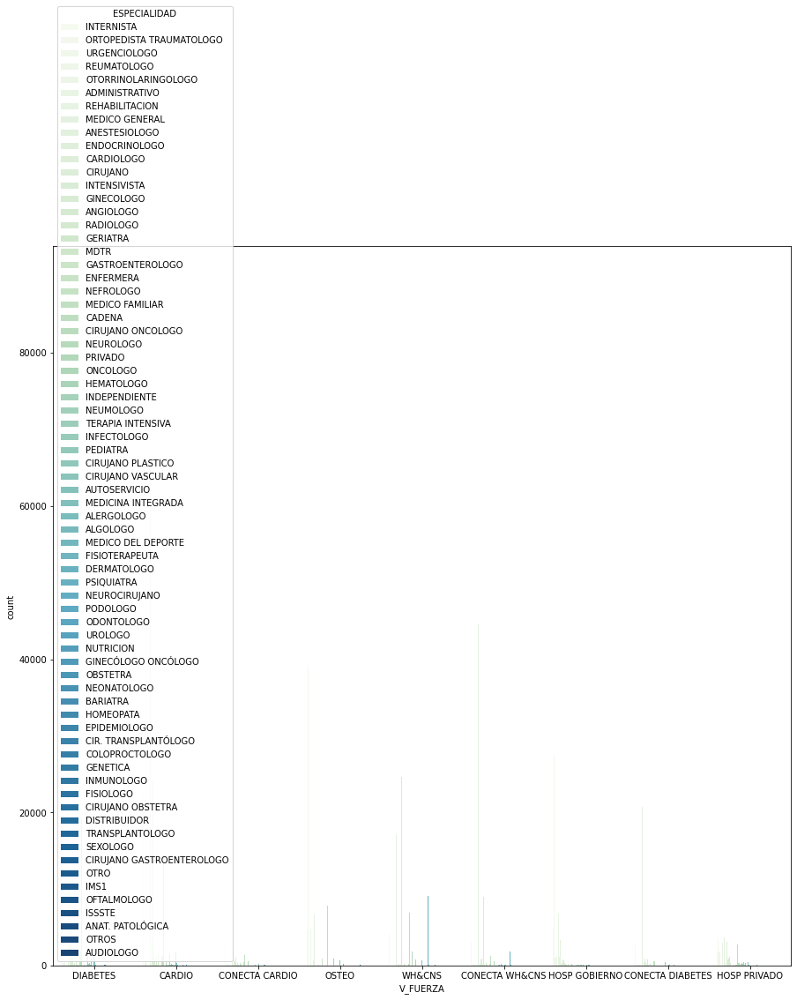

ValueError: Image size of 897x97509 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 1080x1080 with 1 Axes>

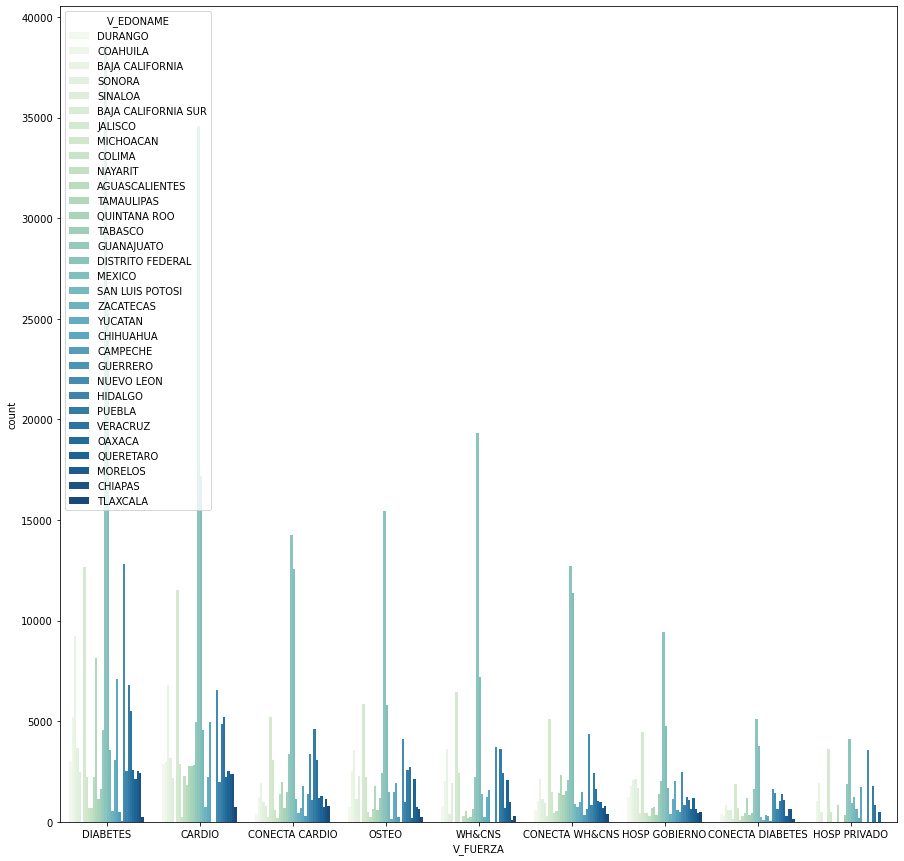

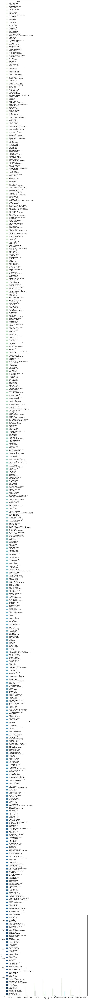

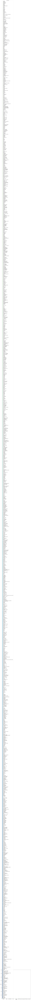

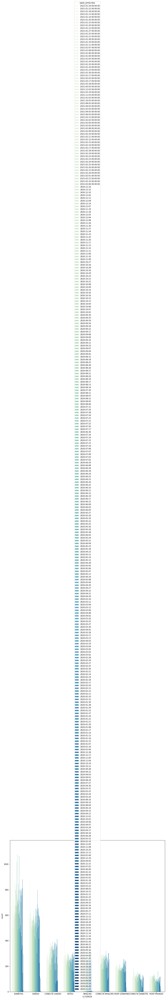

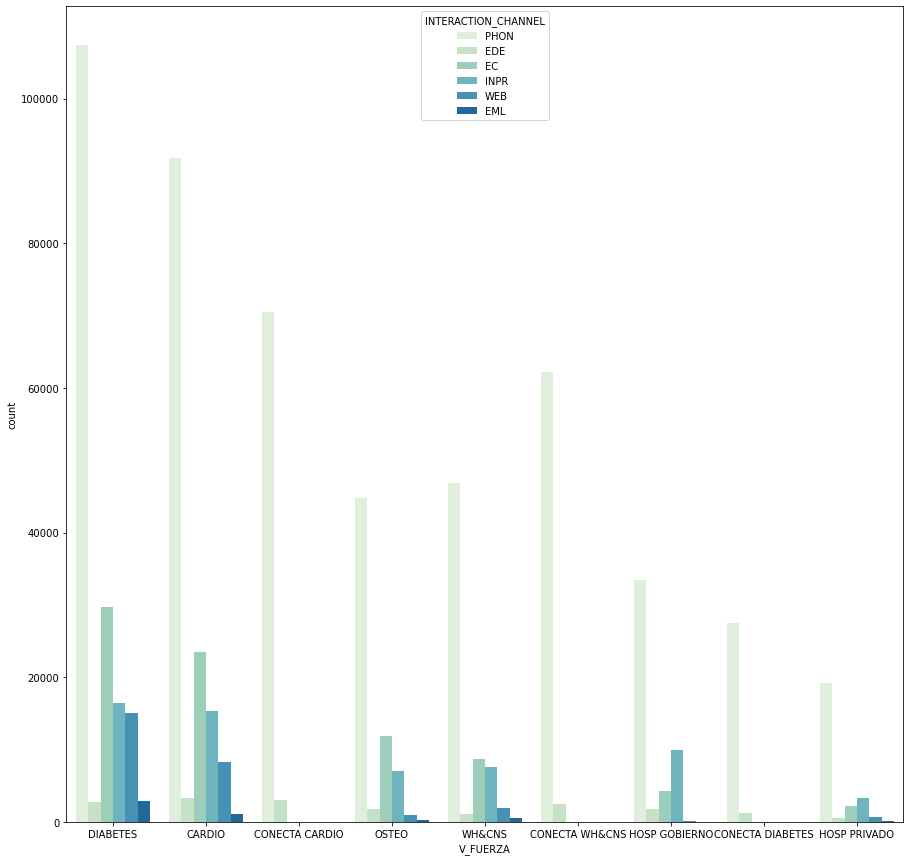

...

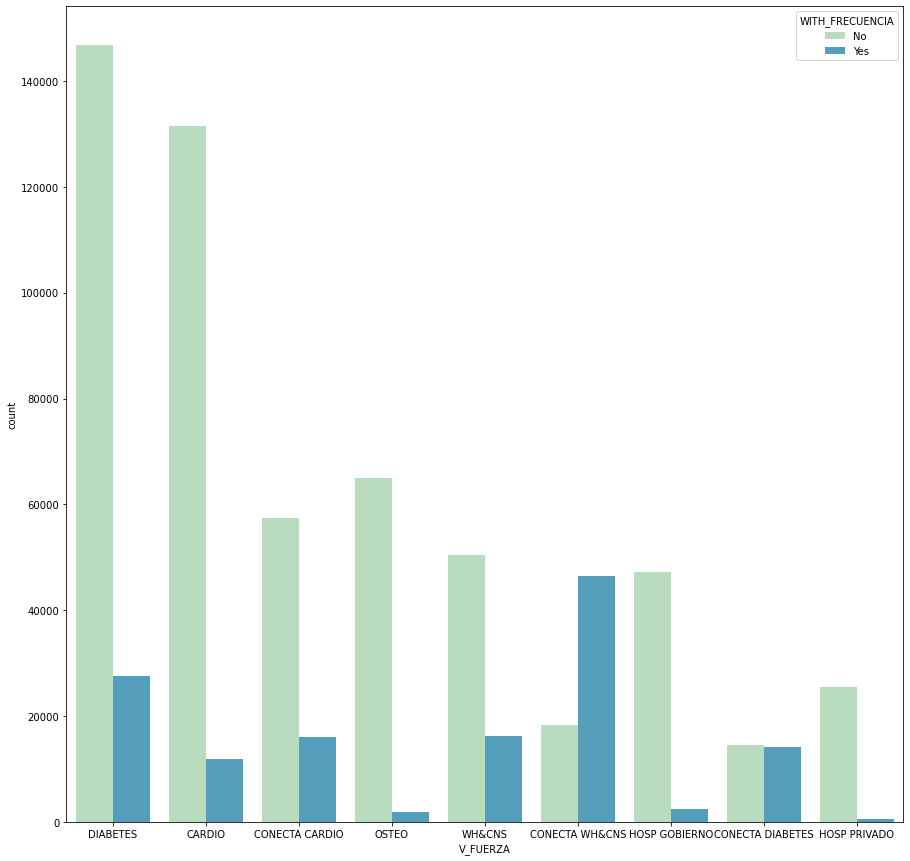

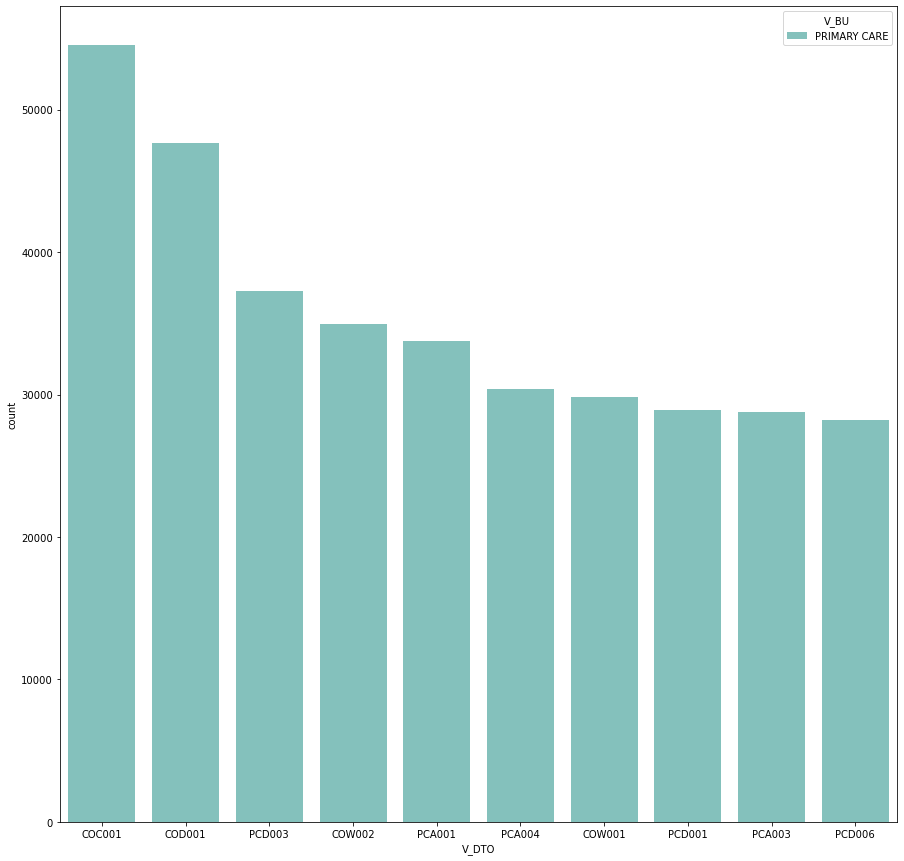

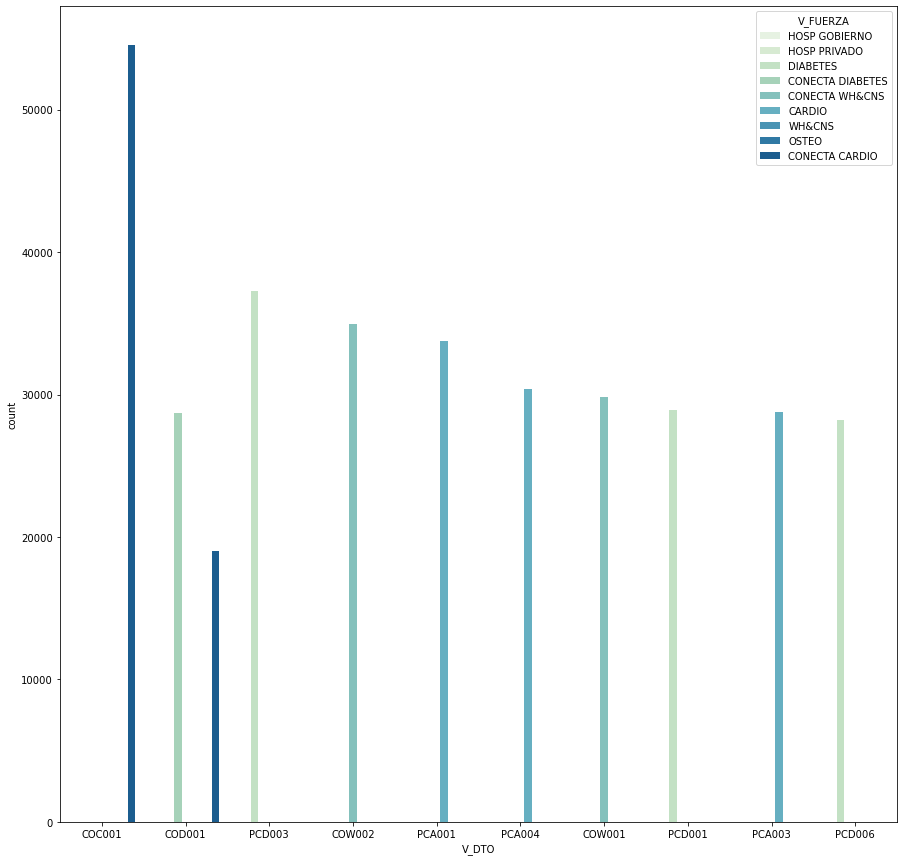

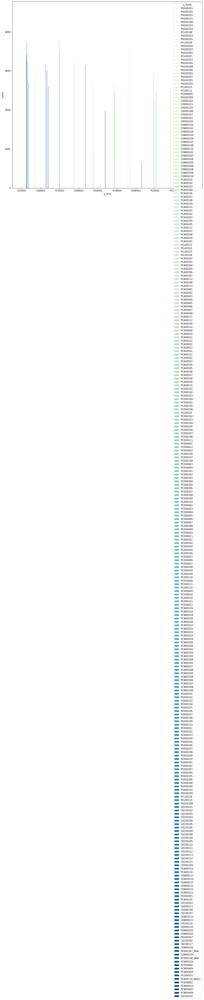

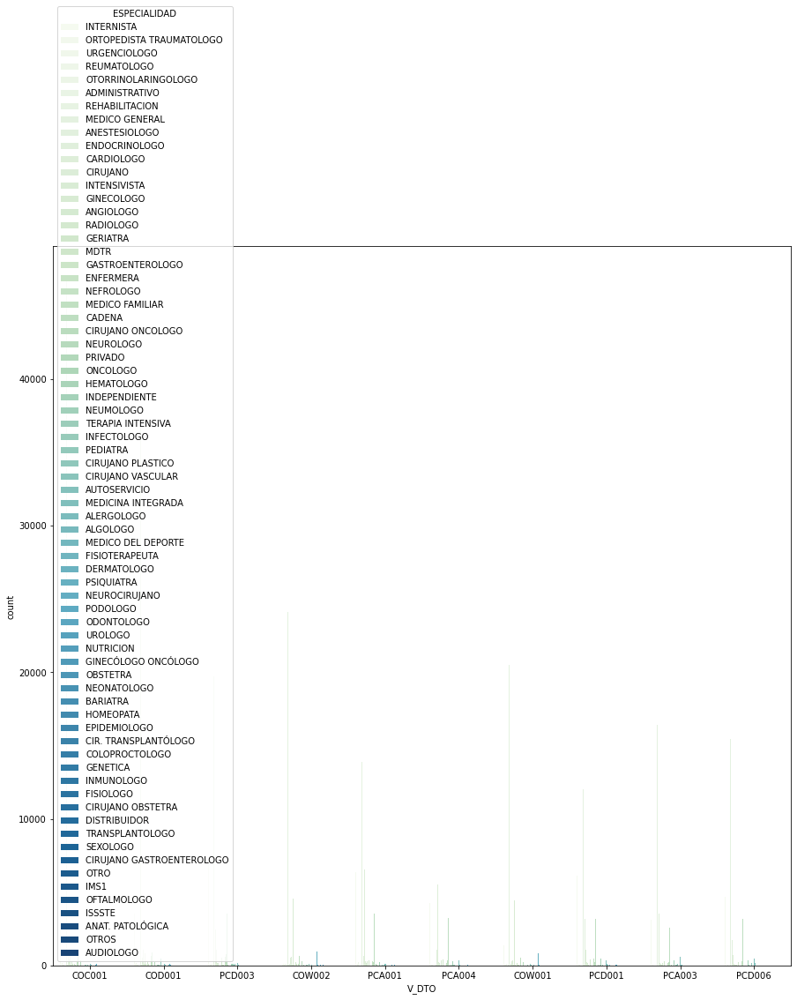

<Figure size 1080x1080 with 0 Axes>

In [58]:
for i in range(0, len(cat_list)):
    primary_cat = cat_list[i]
    for j in range(0, len(cat_list)):
        secondary_cat = cat_list[j]
        if secondary_cat != primary_cat:
            plt.figure(figsize = (15, 15))
            chart = sns.countplot(data = dfVisitasCategorical,
                                 x = primary_cat,
                                 hue = secondary_cat,
                                 palette = 'GnBu',
                                 order = dfVisitasCategorical[primary_cat].value_counts().iloc[:10].index)

Within one grouped bar chart, if the frequency distribution always follows the same pattern across different groups, it suggests that there is no dependency between the primary and secondary category. However, if the distribution is different then it indicates that it is likely that there is a dependency between two variables.

### 3. Categorical vs. Numerical $\Rightarrow$ boxplot or pairplot with hue

**Box plot** is usually adopted when we need to compare how numerical data varies across groups. It is an intuitive way to graphically depict if the variation in categorical features contributes to the difference in values, which can be additionally quantified using ANOVA analysis. In this process, I pair each column in the categorical list with all columns in the numerical list and plot the box plot accordingly.

<ipython-input-59-fd745cca2355>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15, 15))


KeyboardInterrupt: 

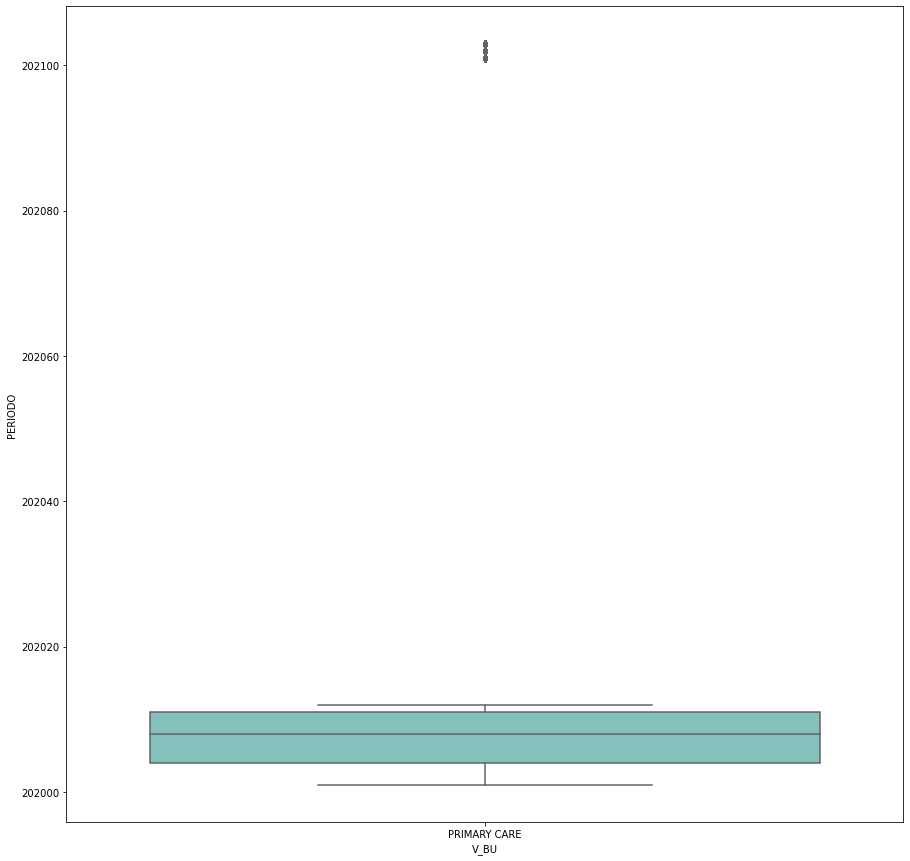

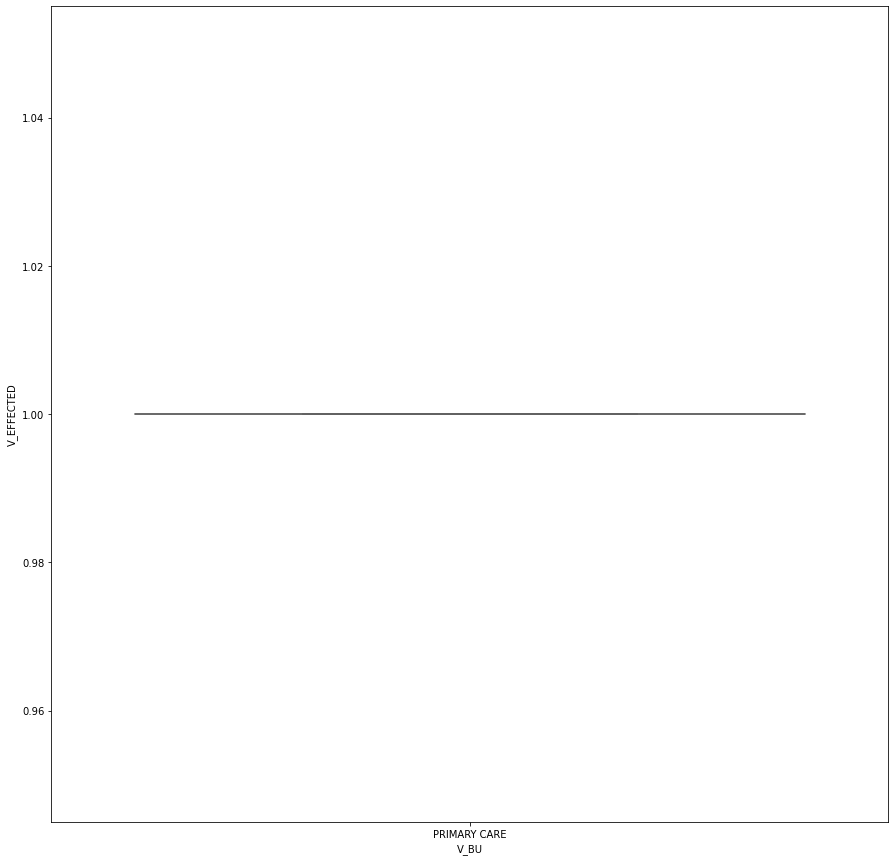

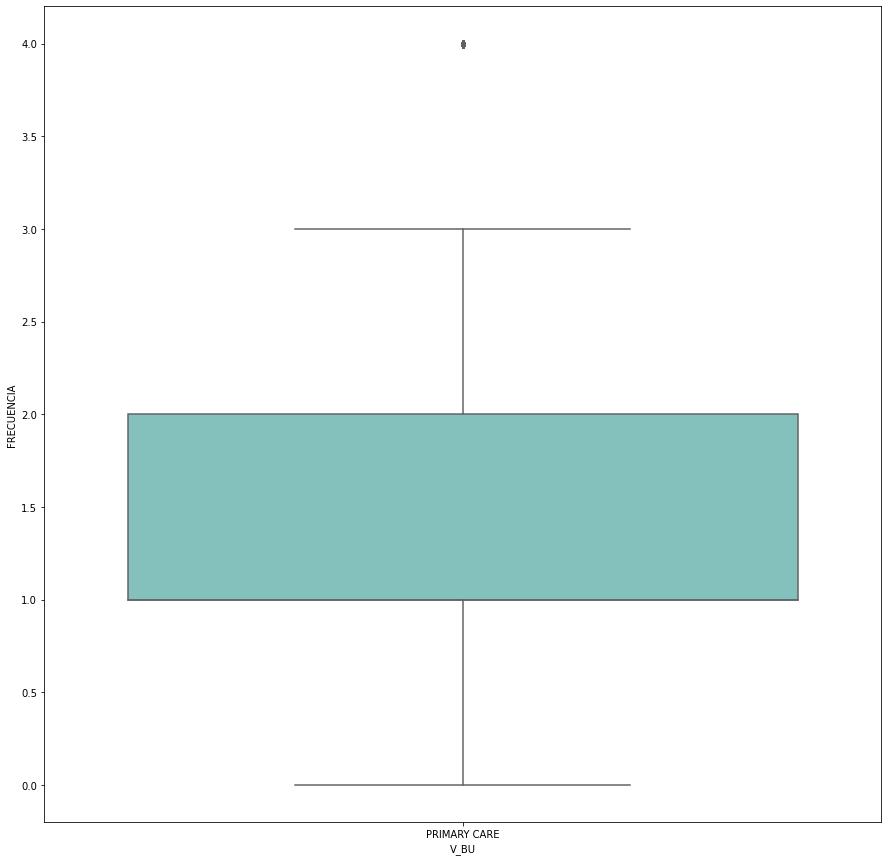

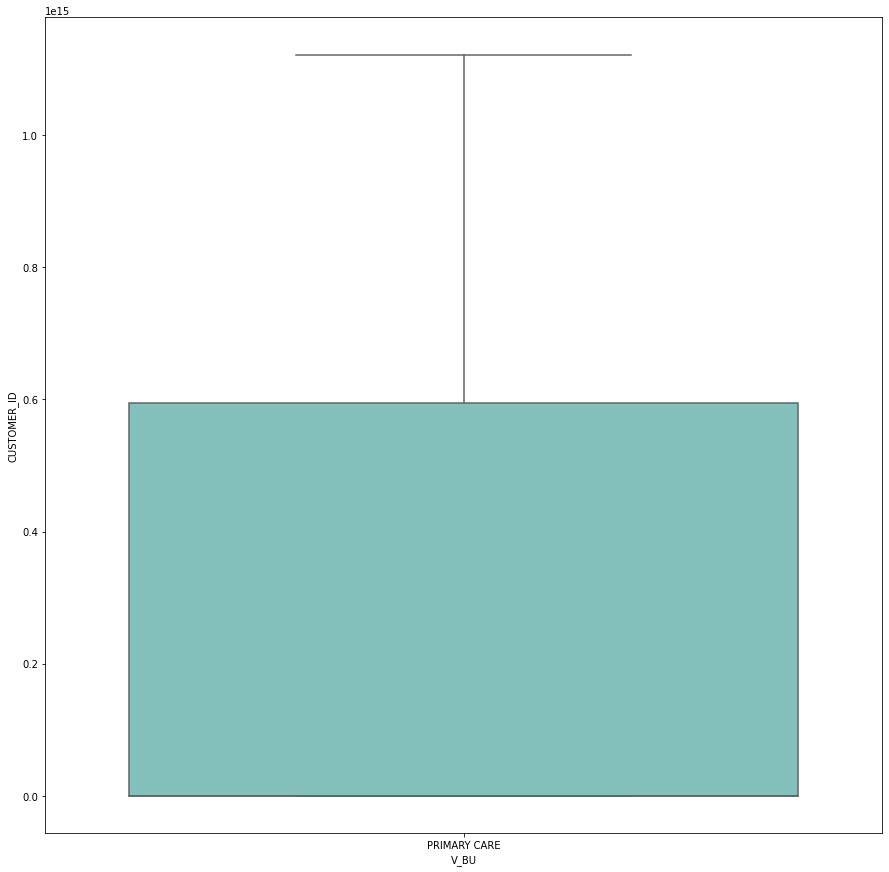

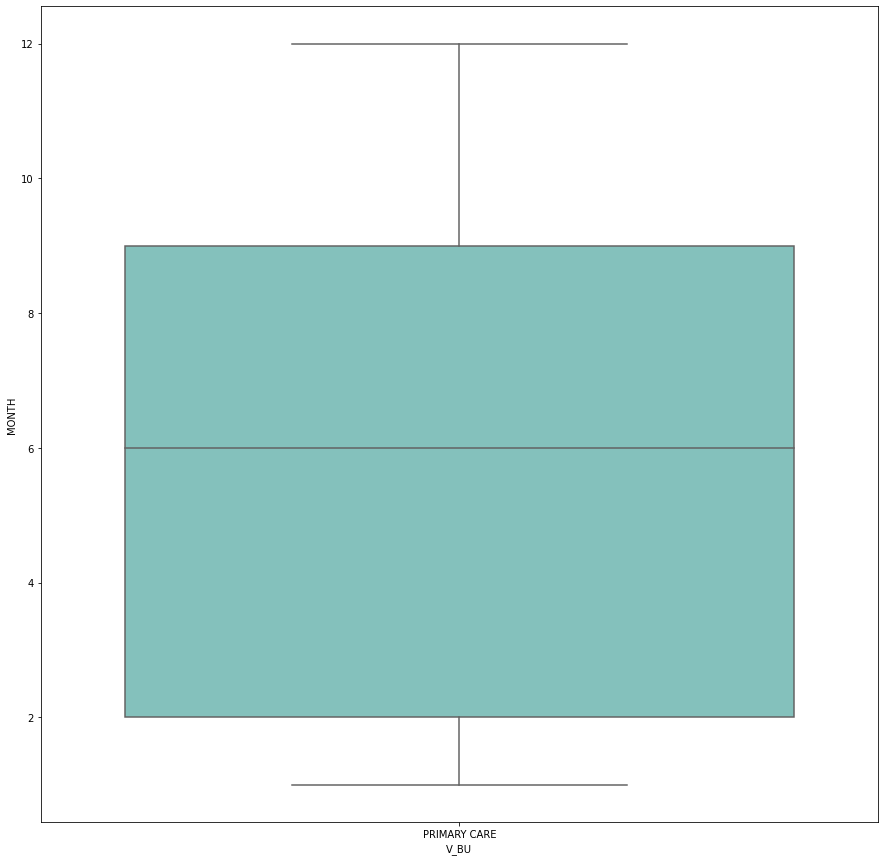

...

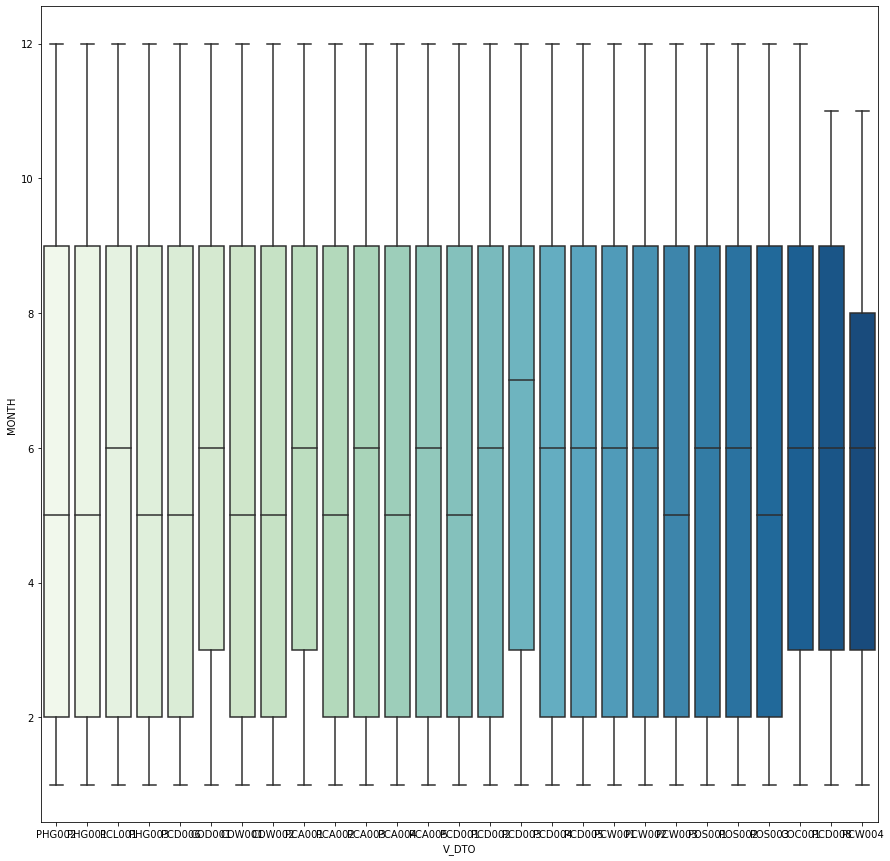

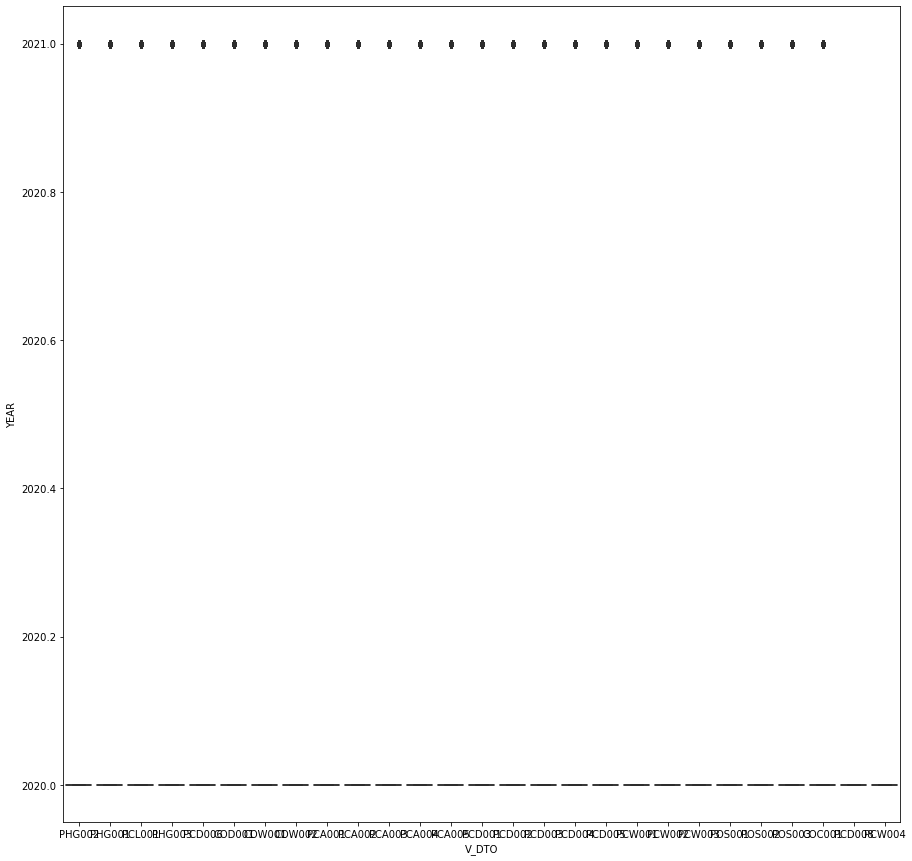

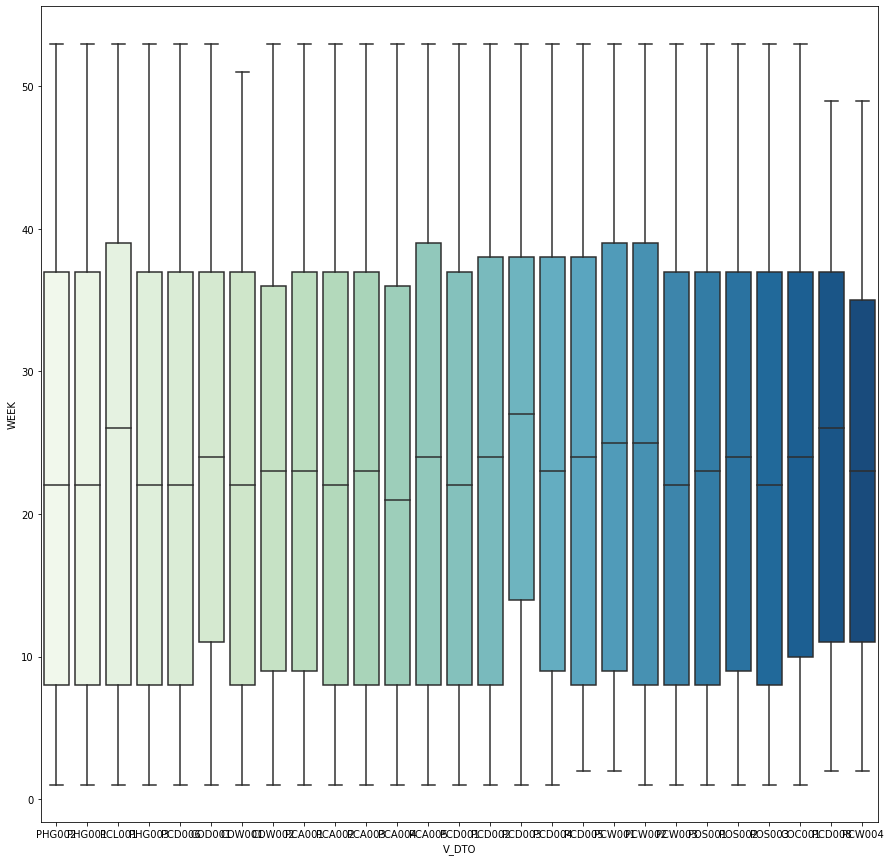

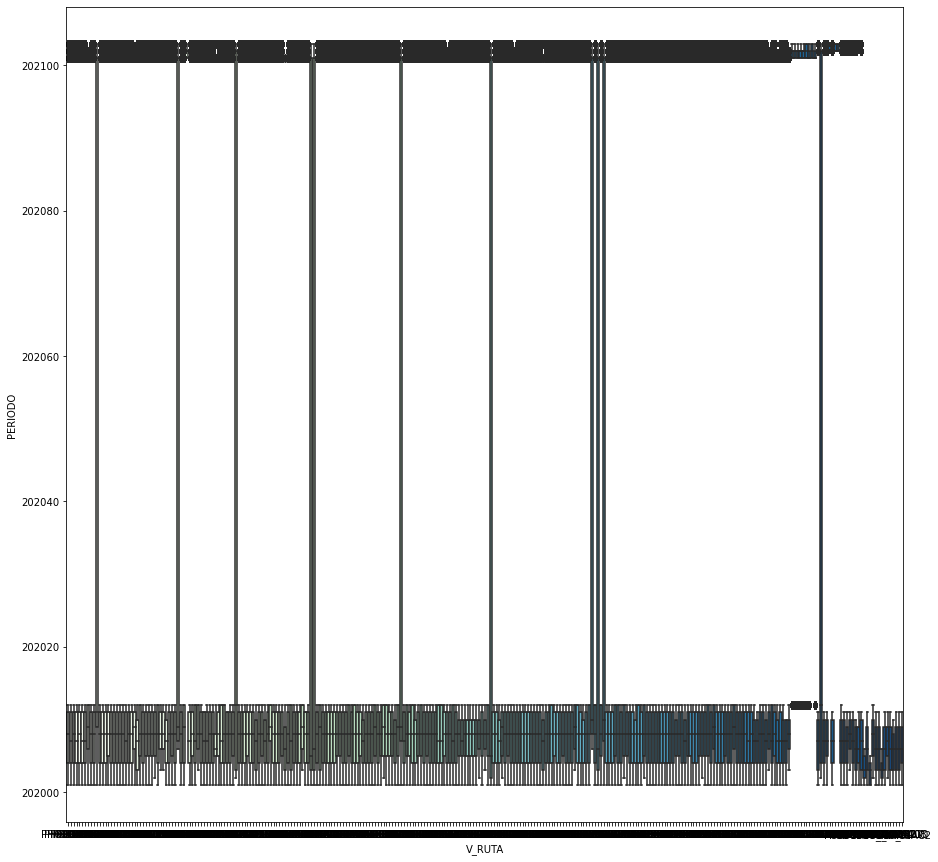

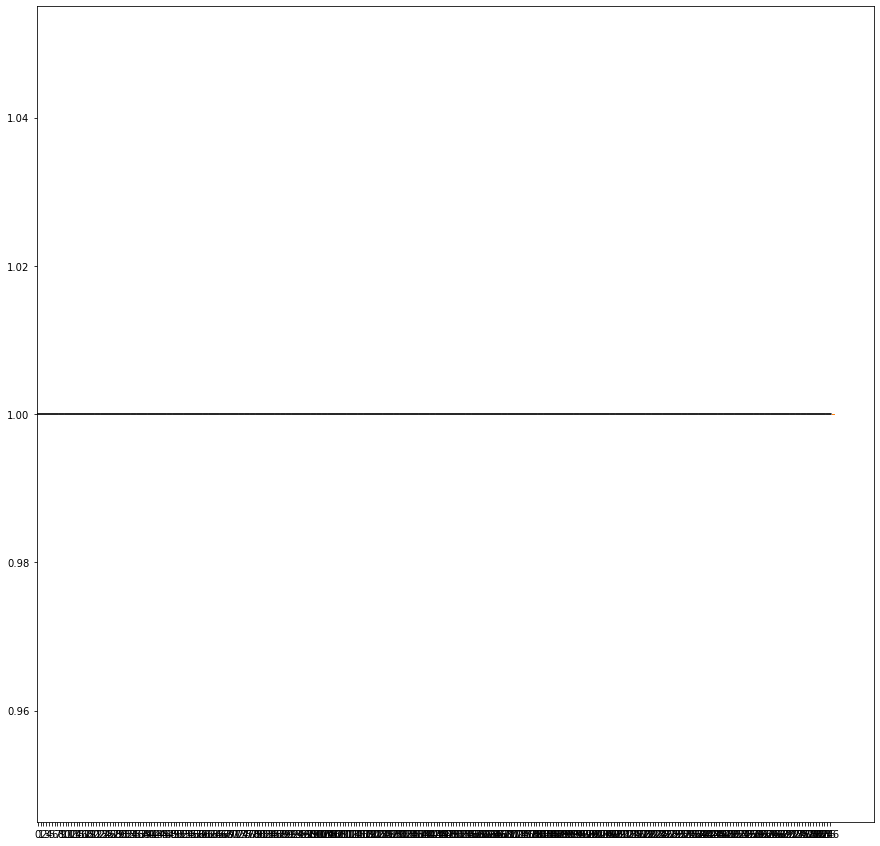

In [59]:
for i in range(0, len(cat_list)):
    cat = cat_list[i]
    for j in range(0, len(num_list)):
        num = num_list[j]
        plt.figure(figsize = (15, 15))
        sns.boxplot(x = cat, y = num, data = dfVisitas2, palette = 'GnBu')
        

Another approach is built upon the **pairplot** that we performed earlier for numerical vs. numerical. To introduce the categorical variable, we can use different hues to represent. Just like what we did for countplot. To do this, we can simply loop through the categorical list and add each element as the hue of the pairplot.

In [ ]:
for i in range(0, len(cat_list)):
    hue_cat = cat_list[i]
    sns.pairplot(dfVisitas2, hue = hue_cat)

## Final THoughts

1. **Know Your Data**: have a bird’s view of the characteristics of the dataset.


2. **Feature Engineering**: transform variables into something more insightful.


3. **Univariate Analysis**: 
    - histogram to visualize numerical data;
    - bar chart to visualize categorical data.


4. **Multivariate Analysis**:
    - Numerical vs. Numerical: correlation matrix, scatterplot (pairplot);
    - Categorical vs. Categorical: Grouped bar chart; 
    - Numerical vs. Categorical: pairplot with hue, box plot.
 

Other than the feature engineering part, the rest of the analysis can be automated. However, it is always better when the automation process is accompanied by some human touch, for example, experimenting on the bin size to optimize the histogram distribution.